In [3538]:
import numpy as np
import sympy as sp
import control
from scipy.linalg import solve_continuous_lyapunov
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.interpolate import interp1d
from sympy.parsing.sympy_parser import parse_expr
from tqdm import tqdm

In [3539]:
def animate_inverted_pendulum(x_pos, theta, time, Len=0.1, r=0.06, margin=0.2, interval=30):
    fig, ax = plt.subplots(figsize=(4, 3)) 
    ax.set_aspect('equal')

    ax.set_xlim(-0.5, 0.5)
    ax.set_ylim(-0.3, 0.3)

    rod_line, = ax.plot([], [], 'b-', lw=2)
    wheel_dot, = ax.plot([], [], 'ko', ms=8)
    time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

    def init():
        rod_line.set_data([], [])
        wheel_dot.set_data([], [])
        time_text.set_text('')
        return rod_line, wheel_dot, time_text

    def update(i):
        x = x_pos[i]
        angle = theta[i]
        x0, y0 = x, r
        x1 = x + Len * np.sin(angle)
        y1 = y0 + Len * np.cos(angle)

        rod_line.set_data([x0, x1], [y0, y1])
        wheel_dot.set_data([x], [r])
        time_text.set_text(f"t = {time[i]:.2f}s")
        return rod_line, wheel_dot, time_text

    ani = FuncAnimation(fig, update, frames=len(time), init_func=init, interval=interval, blit=True)
    return HTML(ani.to_jshtml())

# LQR Control Solver and Simulation

## Initialization

### Define Symbols

In [3540]:
# Parameters
r, Mb, rb, Ib, Mw, Iw, g, tau = sp.symbols('r M_b r_b I_b M_w I_w g tau')

### Define State Space Functions

In [3541]:
with open('../dynamics/output/A.txt', 'r') as f:
    A = parse_expr(f.read())

with open('../dynamics/output/B.txt', 'r') as f:
    B = parse_expr(f.read())

In [3542]:
print(A)
print(B)

Matrix([[0, 1, 0, 0], [0, 0, -M_b**2*g*r**2*r_b**2/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2), 0], [0, 0, 0, 1], [0, 0, I_w*M_b*g*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) + M_b**2*g*r**2*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) + M_b*M_w*g*r**2*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2), 0]])
Matrix([[0], [-I_b*r/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) - M_b*r**2*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) - M_b*r*r_b**2/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2)], [0], [I_w/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) + M_b*r**2/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w*r**2*r_b**2) + M_b*r*r_b/(I_b*I_w + I_b*M_b*r**2 + I_b*M_w*r**2 + I_w*M_b*r_b**2 + M_b*M_w

In [3543]:
# A = sp.Matrix([[0, 1, 0, 0], [-Lb**2*Mb**2*g*r/(Ib*Iw + Ib*Mb*r**2 + Ib*Mw*r**2 + Iw*Lb**2*Mb + Lb**2*Mb*Mw*r**2), 0, -Lb**2*Mb**2*g*r**2/(Ib*Iw + Ib*Mb*r**2 + Ib*Mw*r**2 + Iw*Lb**2*Mb + Lb**2*Mb*Mw*r**2), 0], [0, 0, 0, 1], [(2*Iw*Lb*Mb*g + 2*Lb**2*Mb**2*g*r + 2*Lb*Mb**2*g*r**2 + 2*Lb*Mb*Mw*g*r**2)/(r*(2*Ib*Iw + 2*Ib*Mb*r**2 + 2*Ib*Mw*r**2 + 2*Iw*Lb**2*Mb + 2*Lb**2*Mb*Mw*r**2)), 0, (2*Iw*Lb*Mb*g*r + 2*Lb**2*Mb**2*g*r**2 + 2*Lb*Mb**2*g*r**3 + 2*Lb*Mb*Mw*g*r**3)/(r*(2*Ib*Iw + 2*Ib*Mb*r**2 + 2*Ib*Mw*r**2 + 2*Iw*Lb**2*Mb + 2*Lb**2*Mb*Mw*r**2)), 0]])
# B = sp.Matrix([[0], [(-Ib*r - Lb**2*Mb*r - Lb*Mb*r**2)/(Ib*Iw + Ib*Mb*r**2 + Ib*Mw*r**2 + Iw*Lb**2*Mb + Lb**2*Mb*Mw*r**2)], [0], [(2*Ib*r + 2*Iw*r + 2*Lb**2*Mb*r + 4*Lb*Mb*r**2 + 2*Mb*r**3 + 2*Mw*r**3)/(r*(2*Ib*Iw + 2*Ib*Mb*r**2 + 2*Ib*Mw*r**2 + 2*Iw*Lb**2*Mb + 2*Lb**2*Mb*Mw*r**2))]])
C = sp.Matrix([[0, 0, 0, 0]])
D = sp.Matrix([[0]])

### Define System Parameters

In [3544]:
subs_dict = {
    Mb: 0.366,    # Body Mass
    rb: 0.09,    # Pendulum center of mass
    Ib: 0.0082,   # Body Inertia
    Mw: 0.409 * 2,    # Wheel mass
    Iw: 0.00029,   # Wheel inertia
    r: 0.06,    # Wheel radius
    g: 9.81     # Gravity
}

### Subsitute to Numpy Values

In [3545]:
A_num = np.array(A.subs(subs_dict).evalf().tolist()).astype(np.float64)
B_num = np.array(B.subs(subs_dict).evalf().tolist()).astype(np.float64)
C_num = np.eye(4)
D_num = np.zeros((4, 1))

sys = control.ss(A_num, B_num, C_num, D_num)

### Initial State

In [3546]:
x0 = np.array([0.0, 0.0, 0.1, 0.1])

### No control state response

In [3547]:
T = np.linspace(0,2, 200)
T_out, x_out  = control.forced_response(sys, T, U=0*T, X0=x0)

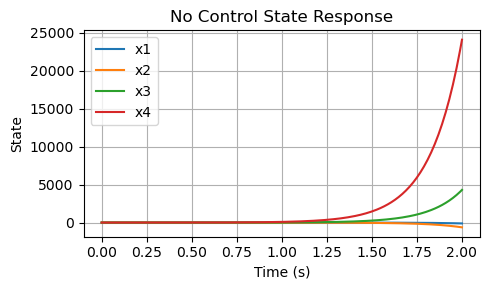

In [3548]:
plt.figure(figsize=(5, 3))
for i in range(x_out.shape[0]):
    plt.plot(T_out, x_out[i], label=f'x{i+1}')
plt.xlabel('Time (s)')
plt.ylabel('State')
plt.title('No Control State Response')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Control Calculator

### Controllability

In [3549]:
ctrb_matrix = control.ctrb(A_num, B_num)
print("Rank of ctrb:", np.linalg.matrix_rank(ctrb_matrix))

Rank of ctrb: 4


In [3550]:
eigvals, eigvecs = np.linalg.eig(A_num)
for i, (eigval, eigvec) in enumerate(zip(eigvals, eigvecs.T)):
    print(f"Eigenvalue {eigval:.4f}:")
    print(f"Corresponding eigenvector:\n{eigvec}\n")

Eigenvalue 0.0000:
Corresponding eigenvector:
[1. 0. 0. 0.]

Eigenvalue 0.0000:
Corresponding eigenvector:
[-1.00000000e+000  4.00833672e-292  0.00000000e+000  0.00000000e+000]

Eigenvalue 5.5994:
Corresponding eigenvector:
[-0.00457806 -0.02563425  0.17575006  0.98409036]

Eigenvalue -5.5994:
Corresponding eigenvector:
[ 0.00457806 -0.02563425 -0.17575006  0.98409036]



### Calculate K by LQR

In [3551]:
Q = np.array([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 10, 0],
    [0, 0, 0, 5]
])
R = np.array([[5]])
K, S, E = control.lqr(A_num, B_num, Q, R)
print("LQR gain K:", K)
print("LQR gain E:", E)

LQR gain K: [[0.4472136  1.04725721 3.20271011 1.150277  ]]
LQR gain E: [-139.56854761+0.j          -0.79875627+0.6200869j
   -0.79875627-0.6200869j   -1.29492839+0.j       ]


### Calculate the new eigen for contolled A

In [3552]:
A_cl = A_num - B_num @ K
eigvals, eigvecs = np.linalg.eig(A_cl)
for i, (eigval, eigvec) in enumerate(zip(eigvals, eigvecs.T)):
    print(f"Eigenvalue {eigval:.4f}:")
    print(f"Corresponding eigenvector:\n{eigvec}\n")
sys_cl = control.ss(A_cl, B_num, C_num, D_num)

Eigenvalue -139.5685+0.0000j:
Corresponding eigenvector:
[-8.57951547e-04+0.j  1.19743051e-01+0.j  7.11320050e-03+0.j
 -9.92779063e-01+0.j]

Eigenvalue -0.7988+0.6201j:
Corresponding eigenvector:
[ 0.52463919+0.40728555j -0.67161127+0.j          0.17646499-0.1488797j
 -0.04863416+0.22834222j]

Eigenvalue -0.7988-0.6201j:
Corresponding eigenvector:
[ 0.52463919-0.40728555j -0.67161127-0.j          0.17646499+0.1488797j
 -0.04863416-0.22834222j]

Eigenvalue -1.2949+0.0000j:
Corresponding eigenvector:
[ 0.52272353+0.j -0.67688955+0.j  0.31675698+0.j -0.4101776 +0.j]



### Gramian

In [3553]:
Wc = solve_continuous_lyapunov(A_cl, -B_num @ B_num.T)
print("Controllability Gramian (via SciPy):\n", Wc)


Controllability Gramian (via SciPy):
 [[ 1.30666597e+00 -1.05894482e-15 -2.17670499e-01 -2.37309235e-14]
 [ 3.55667168e-15  1.71738433e+00  5.03704620e-15 -8.86811993e+00]
 [-2.17670499e-01  1.18585697e-15  1.98175744e-01  1.52167277e-15]
 [-1.91934892e-14 -8.86811993e+00 -2.71158530e-15  6.85587781e+01]]


## Simulation

#### disturbance

In [3554]:
U = np.zeros_like(T)
# U += np.exp(-((T - 5.0)/0.3)**2) * 0.5
# U += np.exp(-((T - 8.0)/0.2)**2) * (-0.15)

### LQR Response

In [3555]:
T = np.linspace(0,10, 200)
T_out, x_out  = control.forced_response(sys_cl, T, U=U, X0=x0)

#### measurement noise

In [3556]:
x_out_noisy = x_out + 0.0002 * np.random.randn(*x_out.shape)

In [3557]:
tau = (-K @ x_out_noisy).flatten()

#### Graphics

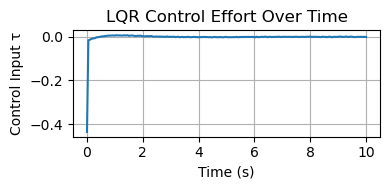

In [3558]:
plt.figure(figsize=(4, 2))
plt.plot(T_out, tau)
plt.xlabel("Time (s)")
plt.ylabel("Control Input τ")
plt.title("LQR Control Effort Over Time")
plt.grid(True)
plt.tight_layout()
plt.show()

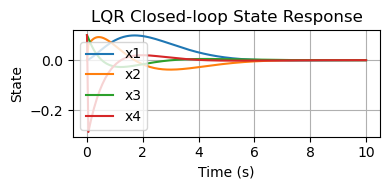

In [3559]:
plt.figure(figsize=(4, 2))
for i in range(x_out.shape[0]):
    plt.plot(T_out, x_out[i], label=f'x{i+1}')
plt.xlabel('Time (s)')
plt.ylabel('State')
plt.title('LQR Closed-loop State Response')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Animation

In [3560]:
# animate_inverted_pendulum(x_out_noisy[0], x_out_noisy[2], T_out)

# LQE Design and Simulation

### Observability

In [3561]:
# A_num = np.array(A.subs(subs_dict).evalf().tolist()).astype(np.float64)
# B_num = np.array(B.subs(subs_dict).evalf().tolist()).astype(np.float64)
C_num = np.array([
    [1, 0, 0, 0],   # x from encoder
    [0, 1, 0, 0],   # ẋ
    [0, 0, 1, 0],   # θ
    [0, 0, 0, 1]    # θ̇
])
D_num = np.zeros((4, 1))

sys = control.ss(A_num, B_num, C_num, D_num)

In [3562]:
O = control.obsv(sys.A, sys.C) 
print(np.linalg.matrix_rank(O))

4


### Design LQE

In [3563]:
x_std = 0.01      # encoder error in meters
dx_std = 0.01       # IMU-integrated linear velocity (m/s)
theta_std = 0.1    # integrated angle error (rad)
dtheta_std = 0.1  # IMU gyro noise (rad/s)


# Rn = np.diag([1e-6, 1e-6, 1e-6, 1e-6])  # reduce measurement noise → trust sensors
Rn = np.diag([
    (x_std),
    (dx_std),
    (theta_std),
    (dtheta_std)
])
G = np.eye(4)
# Qn = np.diag([1e6, 1e6, 1e6, 1e6])      # increase process noise → fast observer
Qn = np.diag([
    1,   # x
    1,   # dx (e.g., friction force uncertainty)
    1,   # theta (e.g., small external torque)
    1    # dtheta (e.g., fast unmodeled torque effect)
])
L, P, E = control.lqe(sys.A, G, sys.C, Qn, Rn)

In [3564]:
print(E)

[-10.00061091+0.49841741j -10.00061091-0.49841741j
  -8.55529911+5.62173888j  -8.55529911-5.62173888j]


In [3565]:
print(P)

[[ 1.00373935e-01  4.99584421e-03 -1.47061347e-04 -5.42290545e-04]
 [ 4.99584421e-03  1.00198064e-01 -6.55256909e-03 -1.95259160e-02]
 [-1.47061347e-04 -6.55256909e-03  1.62467127e-01  3.88400511e-01]
 [-5.42290545e-04 -1.95259160e-02  3.88400511e-01  1.54299489e+00]]


In [3566]:
# desired_observer_poles = np.array([-30, -31, -32, -33]) 
# L = control.place(sys.A.T, sys.C.T, desired_observer_poles).T

In [3567]:
print(L)

[[ 1.00373935e+01  4.99584421e-01 -1.47061347e-03 -5.42290545e-03]
 [ 4.99584421e-01  1.00198064e+01 -6.55256909e-02 -1.95259160e-01]
 [-1.47061347e-02 -6.55256909e-01  1.62467127e+00  3.88400511e+00]
 [-5.42290545e-02 -1.95259160e+00  3.88400511e+00  1.54299489e+01]]


# LQG Control

In [3568]:
def lqg_closed_loop(t, z, A, B, C, K, L):
    x = z[:4]
    x_hat = z[4:]

    u = -K @ x_hat
    u = np.clip(u, -10, 10) 

    y = C @ x

    D = np.zeros_like(x)

    # D = np.random.normal(loc=0.0, scale=np.array([
    #     0.001,  # (1 mm)
    #     0.01,   # (1 cm/s)
    #     0.01,   # (0.01 rad)
    #     0.1     # (0.1 rad/s)
    # ]))


    dx = A @ x + B @ u + D
    dx_hat = A @ x_hat + B @ u + L @ (y - C @ x_hat)
    
    return np.concatenate([dx, dx_hat])


### Simulation

In [3569]:
# xhat0 = np.zeros(4)  # Intial Estimtated
xhat0 = x0.copy()
z0 = np.concatenate([x0, xhat0]) 


t_span = (0, 5)
t_eval = np.linspace(*t_span, 500)


sol = solve_ivp(
    fun=lambda t, z: lqg_closed_loop(t, z, sys.A, sys.B, sys.C, K, L),
    t_span=t_span,
    y0=z0,
    t_eval=t_eval
)

x_hist = sol.y[:4]   
xhat_hist = sol.y[4:]

tau_log = (-K @ xhat_hist).flatten()

x_hist = sol.y[:4]   
xhat_hist = sol.y[4:]

error = np.linalg.norm(x_hist - xhat_hist, axis=0)
print("Max estimation error:", np.max(error))

Max estimation error: 0.0


In [3570]:
tau_log.size

500

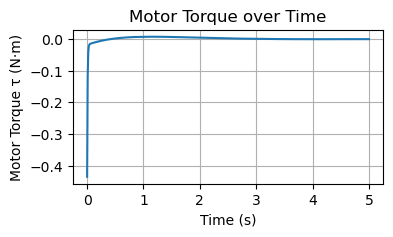

In [3571]:
plt.figure(figsize=(4, 2))
plt.plot(t_eval, tau_log)
plt.xlabel("Time (s)")
plt.ylabel("Motor Torque τ (N·m)")
plt.title("Motor Torque over Time")
plt.grid(True)
plt.show()

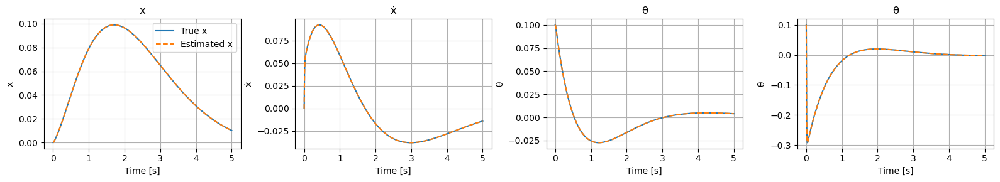

In [3572]:
labels = ['x', 'ẋ', 'θ', 'θ̇']
t = sol.t

fig, axes = plt.subplots(1, 4, figsize=(16, 3))

for i in range(4):
    ax = axes[i]
    ax.plot(t, x_hist[i], label=f'True {labels[i]}')
    ax.plot(t, xhat_hist[i], '--', label=f'Estimated {labels[i]}')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel(labels[i])
    ax.set_title(f'{labels[i]}')
    ax.grid(True)
    if i == 0:
        ax.legend()

plt.tight_layout()
plt.show()


In [3573]:
# animate_inverted_pendulum(x_hist[0], x_hist[2], time = sol.t)

## Continuous Simulation

In [3574]:
# xhat0 = np.zeros(4)                     # Initial estimated state
xhat0 = x0.copy()
z0 = np.concatenate([x0, xhat0])        # Combined initial state

dt = 0.01
T_total = 10
t_eval = np.arange(0, T_total + dt, dt)

In [3575]:
def lqg_closed_loop_continuous(t, z, A, B, C, K, L, disturbances):
    x = z[:4]
    x_hat = z[4:]

    u = -K @ x_hat
    u = np.clip(u, -10, 10)

    y = C @ x


    D = np.random.normal(loc=0.0, scale=np.array([
        0.001,  # (1 mm)
        0.01,   # (1 cm/s)
        0.01,   # (0.01 rad)
        0.1     # (0.1 rad/s)
    ]))


    for disturb in disturbances:
        if abs(t - disturb['time']) < dt / 2:
            D[disturb['index']] += disturb['value']

    dx = A @ x + B @ u + D
    dx_hat = A @ x_hat + B @ u + L @ (y - C @ x_hat)

    dz = np.concatenate([dx, dx_hat])
    return dz


In [3576]:
disturbances = [
    {'time': 1.0, 'index': 1, 'value': 5},  # cart velocity
    {'time': 3.0, 'index': 3, 'value': 5}   # pendulum angular velocity 
]

sol = solve_ivp(
    fun=lambda t, z: lqg_closed_loop_continuous(t, z, sys.A, sys.B, sys.C, K, L, disturbances),
    t_span=(0, T_total),
    y0=z0,
    t_eval=t_eval
)

x_hist = sol.y[:4]   
xhat_hist = sol.y[4:]
tau_log = (-K @ xhat_hist).flatten()


In [3577]:
tau_log.size

1001

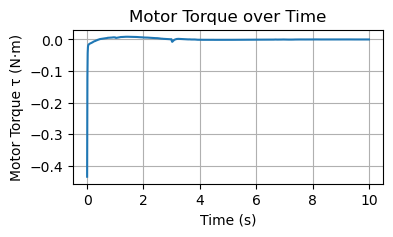

In [3578]:
plt.figure(figsize=(4, 2))
plt.plot(t_eval, tau_log)
plt.xlabel("Time (s)")
plt.ylabel("Motor Torque τ (N·m)")
plt.title("Motor Torque over Time")
plt.grid(True)
plt.show()

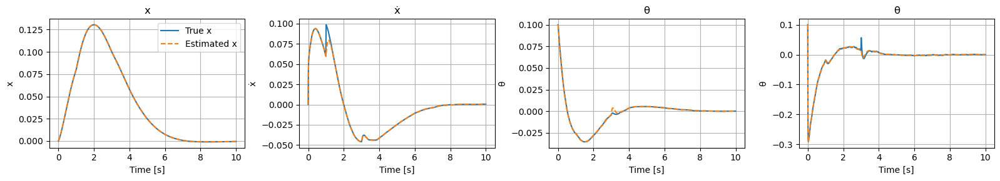

In [3579]:
labels = ['x', 'ẋ', 'θ', 'θ̇']
t = sol.t

fig, axes = plt.subplots(1, 4, figsize=(16, 3))

for i in range(4):
    ax = axes[i]
    ax.plot(t, x_hist[i], label=f'True {labels[i]}')
    ax.plot(t, xhat_hist[i], '--', label=f'Estimated {labels[i]}')
    ax.set_xlabel('Time [s]')
    ax.set_ylabel(labels[i])
    ax.set_title(f'{labels[i]}')
    ax.grid(True)
    if i == 0:
        ax.legend()

plt.tight_layout()
plt.show()

In [3580]:
# animate_inverted_pendulum(x_hist[0], x_hist[2], time = sol.t)

In [3581]:
A_cl = np.block([
    [sys.A - sys.B @ K,       sys.B @ K],
    [L @ sys.C,     sys.A - L @ sys.C - sys.B @ K]
])

eigvals = np.linalg.eigvals(A_cl)
print(np.max(np.real(eigvals))) 

8.4612842121359


In [3582]:
print(sys.A)

[[ 0.          1.          0.          0.        ]
 [ 0.          0.         -0.81670402  0.        ]
 [ 0.          0.          0.          1.        ]
 [ 0.          0.         31.35299342  0.        ]]


In [3583]:
print(sys.B)

[[  0.        ]
 [-16.80450252]
 [  0.        ]
 [139.14876601]]


## Simulation in Non-Linear System

In [3584]:
t = sp.symbols('t')
x = sp.symbols('x')
dx = sp.Derivative(sp.Function('x')(t), t)
theta_func = sp.Function('theta')(t)
theta = theta_func
dtheta = sp.Derivative(theta_func, t)
tau = sp.symbols('tau')

params = {
    'Mb': 0.366,
    'rb': 0.09,
    'Ib': 0.0082,
    'Mw': 0.409 * 2,
    'Iw': 0.00029,
    'r': 0.06,
    'g': 9.81
}

param_subs = {
    sp.symbols('M_b'): params['Mb'],
    sp.symbols('M_w'): params['Mw'],
    sp.symbols('I_b'): params['Ib'],
    sp.symbols('I_w'): params['Iw'],
    sp.symbols('r'): params['r'],
    sp.symbols('r_b'): params['rb'],
    sp.symbols('g'): params['g'],
}

In [3585]:
with open('../dynamics/output/xdd_solution.txt', 'r') as f:
    xdd_solution = parse_expr(f.read())

with open('../dynamics/output/thetadd_solution.txt', 'r') as f:
    thetadd_solution = parse_expr(f.read())

xdd_partial = xdd_solution.subs(param_subs)
thetadd_partial = thetadd_solution.subs(param_subs)

In [3586]:
display(xdd_partial)
display(thetadd_partial)

-0.000118584*tau*cos(theta(t))/(5.082572504e-5 - 3.90615696e-6*cos(theta(t))**2) - 0.000669876*tau/(5.082572504e-5 - 3.90615696e-6*cos(theta(t))**2) - 3.83193997776e-5*sin(theta(t))*cos(theta(t))/(5.082572504e-5 - 3.90615696e-6*cos(theta(t))**2) + 1.3239429264e-6*sin(theta(t))*Derivative(theta(t), t)**2/(5.082572504e-5 - 3.90615696e-6*cos(theta(t))**2)

0.0019764*tau*cos(theta(t))/(5.082572504e-5 - 3.90615696e-6*cos(theta(t))**2) + 0.0045524*tau/(5.082572504e-5 - 3.90615696e-6*cos(theta(t))**2) - 3.90615696e-6*sin(theta(t))*cos(theta(t))*Derivative(theta(t), t)**2/(5.082572504e-5 - 3.90615696e-6*cos(theta(t))**2) + 0.00147106890936*sin(theta(t))/(5.082572504e-5 - 3.90615696e-6*cos(theta(t))**2)

In [3587]:
def xdd_solution_numerical(pos, vel, theta, dtheta, tau):
    cos_theta = np.cos(theta)
    sin_theta = np.sin(theta)
    cos_theta_squared = cos_theta * cos_theta

    denominator = 5.082572504e-5 - 3.90615696e-6 * cos_theta_squared

    term1 = -0.000118584 * tau * cos_theta / denominator
    term2 = -0.000669876 * tau / denominator
    term3 = -3.83193997776e-5 * sin_theta * cos_theta / denominator
    term4 = 1.3239429264e-6 * sin_theta * dtheta * dtheta / denominator

    return term1 + term2 + term3 + term4

def thetadd_solution_numerical(pos, vel, theta, dtheta, tau):
    cos_theta = np.cos(theta)
    sin_theta = np.sin(theta)
    cos_theta_squared = cos_theta * cos_theta

    denominator = 5.082572504e-5 - 3.90615696e-6 * cos_theta_squared

    term1 = 0.0019764 * tau * cos_theta / denominator
    term2 = 0.0045524 * tau / denominator
    term3 = -3.90615696e-6 * sin_theta * cos_theta * dtheta * dtheta / denominator
    term4 = 0.00147106890936 * sin_theta / denominator

    return term1 + term2 + term3 + term4

In [3588]:
# Parameters
T_total = 15
dt = 0.01
frame = int(T_total/dt)

# Pre-allocate storage
x_true = np.zeros((4, frame))
x_hat = np.zeros((4, frame))
u_list = np.zeros(frame)

x_true[:, 0] = x0
x_hat[:, 0] = x0

deadzone_threshold = 0.01
max_boost = 0.05
# Define max torque limit
max_tau = 1.0 

In [3589]:
def realWorldSimulation(frame):
    measurement_noise = np.vstack([
        np.random.normal(0, 0.01, size=frame),  # pos noise
        np.random.normal(0, 0.08, size=frame),   # vel noise
        np.random.normal(0, 0.01, size=frame),   # theta noise
        np.random.normal(0, 0.07, size=frame)   # dtheta noise
    ])

    disturbance_values = np.vstack([
    np.random.normal(0, 0.00, size=frame),  # dx disturbance
    np.random.normal(0, 0.00, size=frame),   # ddx disturbance
    np.random.normal(0, 0.00, size=frame),  # dtheta disturbance
    np.random.normal(0, 0.03, size=frame)   # ddtheta disturbance
    ])
    
    impulse = np.zeros((4, frame))
    # impulse[5, 100] = 1.0
    # impulse[3, 500] = 0.3

    return measurement_noise, disturbance_values, impulse

In [3590]:
def applySmoothBoost(u, deadzone_threshold, max_boost):
    if u > 0 and u < deadzone_threshold:
        scale = u / deadzone_threshold
        return u + (1.0 - scale) * max_boost
    elif u < 0 and u > -deadzone_threshold:
        scale = -u / deadzone_threshold
        return u - (1.0 - scale) * max_boost
    return u

In [3591]:
def updateLQGNonlinear(y,x_hat,dt):
    # Measurement vector y
    pos, vel, theta, dtheta = y

    # Compute initial control u = -K * x_hat
    K_flatten = K.flatten()
    u = (-K_flatten @ x_hat)   #should be a scaler

    # Compute dx_hat = [dx, ddx, dtheta, ddtheta]
    dx_hat = np.zeros(4)
    dx_hat[0] = x_hat[1]
    dx_hat[1] = xdd_solution_numerical(x_hat[0], x_hat[1], x_hat[2], x_hat[3], u)
    print(dx_hat[1])
    dx_hat[2] = x_hat[3]
    dx_hat[3] = thetadd_solution_numerical(x_hat[0], x_hat[1], x_hat[2], x_hat[3], u)
    # print(dx_hat[1])

    # Measurement error: y - y_hat
    y_error = y - x_hat #assume here is full state with C identity matrix

    # Observer correction
    L_scaleDown = L*0.001
    for i in range(4):
        for j in range(4):
            dx_hat[i] += L_scaleDown[i][j] * y_error[j]

    # Update state estimate
    for i in range(4):
        x_hat[i] += dt * dx_hat[i]

    # Recompute control with updated state estimate
    u = (-K_flatten @ x_hat)

    u = applySmoothBoost(u, deadzone_threshold, max_boost)  # apply boost

    return u, x_hat


In [3592]:
# Real word disturbance
measurement_noise, disturbance_values, impulse = realWorldSimulation(frame)

for i in range(0, frame-1):
    #Add Measurement noise
    y_meas = x_true[:, i] + measurement_noise[:,i]

    # Prepare x_hat_current
    x_hat_current = x_hat[:, i].copy()

    # Compute control and update observer
    u_current, x_hat_next = updateLQGNonlinear(y_meas, x_hat_current, dt)

    # Store data
    u_list[i] = u_current
    x_hat[:, i + 1] = x_hat_next

    # Disturbance at current time step
    disturbance = disturbance_values[:, i]+impulse[:,i]

    # Real world dynamics
    dx = np.zeros(4)
    dx[0] = x_true[1, i] + disturbance[0]  # velocity disturbance (optional)
    dx[1] = xdd_solution_numerical(*x_true[:, i], u_current) + disturbance[1]  # acceleration + disturbance
    dx[2] = x_true[3, i] + disturbance[2]  # angular velocity disturbance (optional)
    dx[3] = thetadd_solution_numerical(*x_true[:, i], u_current) + disturbance[3]

    x_true[:, i + 1] = x_true[:, i] + dt * dx


7.222390386214775
-2.51422370620012
1.2967850962853298
-0.2102220434971825
0.3707101330057191
0.13161796863663178
0.21551849121675268
0.1719573775252457
0.17984678413080457
0.16617702162313697
0.16193018415224988
0.15419695029698993
0.1480538037668304
0.14130694176742434
0.1353709462236099
0.12908401734293906
0.12288443799857621
0.11708936963535026
0.11151783526208106
0.10609747770253622
0.10074510685611365
0.0947459563005534
0.0896411181781218
0.08463822252512422
0.07933504389774572
0.07507240960291872
0.06956512219186486
0.06559920619491207
0.060754850781236575
0.056329881374156336
0.05118400104944365
0.048354972179346915
0.043684162906001724
0.040029930721663484
0.03537647634536319
0.03210697188138596
0.02809557406543324
0.024333108723367077
0.02095029079366235
0.017994510328113306
0.014126382979728468
0.011536829017955637
0.00810472341446956
0.005028772309962843
0.0018930661043060893
-0.0007843242016679211
-0.003039941222687337
-0.005428470591502215
-0.008711175591595456
-0.0100560

In [3593]:
u_list

array([ 0.14501656, -0.08192735,  0.01798808, ...,  0.04918391,
        0.04924263,  0.        ], shape=(1500,))

In [ ]:
# # x_true: ground truth
# # x_hat: estimated state (observer)
# # u_list: control input history

# # Convert theta to degrees for better readability
# theta_true_deg = np.rad2deg(x_true[2])
# theta_hat_deg = np.rad2deg(x_hat[2])

# time = np.arange(0, T_total + dt, dt)

# plt.figure(figsize=(12, 10))

# # --- 1. Position ---
# plt.subplot(5, 1, 1)
# plt.plot(time, x_true[0], label='x (true)')
# plt.plot(time, x_hat[0], '--', label='x̂ (estimate)')
# plt.ylabel('Position (m)')
# plt.legend()
# plt.grid(True)

# # --- 2. Velocity ---
# plt.subplot(5, 1, 2)
# plt.plot(time, x_true[1], label='dx (true)')
# plt.plot(time, x_hat[1], '--', label='dx̂ (estimate)')
# plt.ylabel('Velocity (m/s)')
# plt.legend()
# plt.grid(True)

# # --- 3. Angle (theta) ---
# plt.subplot(5, 1, 3)
# plt.plot(time, theta_true_deg, label='θ (true)')
# plt.plot(time, theta_hat_deg, '--', label='θ̂ (estimate)')
# plt.ylabel('Angle (deg)')
# plt.legend()
# plt.grid(True)

# # --- 4. Angular velocity ---
# plt.subplot(5, 1, 4)
# plt.plot(time, x_true[3], label='dθ (true)')
# plt.plot(time, x_hat[3], '--', label='dθ̂ (estimate)')
# plt.ylabel('Angular Velocity (rad/s)')
# plt.legend()
# plt.grid(True)

# # --- 5. Control input ---
# plt.subplot(5, 1, 5)
# plt.plot(time, u_list, label='u (control input)')
# plt.ylabel('Torque (tau)')
# plt.xlabel('Time (s)')
# plt.legend()
# plt.grid(True)

# plt.tight_layout()
# plt.show()



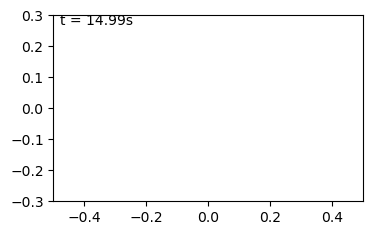

In [3595]:
time = np.arange(0, T_total, dt)
animate_inverted_pendulum(x_pos = x_hat[0], theta=x_hat[2] , time = time)